In [1]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline

In [2]:
df = pd.read_csv('full_df.csv')
df.drop(['Unnamed: 0'], axis=1, inplace = True)

In [3]:
df.head()

,team,merge_name,season,playerId,name,position,games_played,icetime,shifts,onIce_xGoalsPercentage,...,S.BONUS,P.BONUS,CNTRCT_AGE,Team,State/Prov,Country,Conference,Division,O6,EffTaxRate
0,ANA,aaronward,2009,8458519,Aaron Ward,D,76,78481,1741,0.37,...,0.0,0.0,1,Anaheim Ducks,CA,USA,Western,Pacific,False,0.466
1,ANA,adamcracknell,2018,8471490,Adam Cracknell,R,2,1252,35,0.35,...,0.0,0.0,0,Anaheim Ducks,CA,USA,Western,Pacific,False,0.466
2,ANA,adamhenrique,2017,8474641,Adam Henrique,C,81,86436,1844,0.53,...,0.0,0.0,4,Anaheim Ducks,CA,USA,Western,Pacific,False,0.466
3,ANA,adamhenrique,2018,8474641,Adam Henrique,C,82,80933,1772,0.52,...,0.0,0.0,5,Anaheim Ducks,CA,USA,Western,Pacific,False,0.466
4,ANA,adamhenrique,2019,8474641,Adam Henrique,C,71,71283,1589,0.54,...,0.0,0.0,1,Anaheim Ducks,CA,USA,Western,Pacific,False,0.466


In [4]:
df.shape

(11205, 50)

In [5]:
df.columns

Index(['team', 'merge_name', 'season', 'playerId', 'name', 'position',
       'games_played', 'icetime', 'shifts', 'onIce_xGoalsPercentage',
       'offIce_xGoalsPercentage', 'penalties', 'faceoffsWon',
       'penalityMinutes', 'penalityMinutesDrawn', 'shotsBlockedByPlayer',
       'I_F_goals', 'I_F_primaryAssists', 'I_F_secondaryAssists', 'I_F_points',
       'I_F_hits', 'PLAYER', 'AGE', 'WEIGHT', 'HEIGHT', 'POS', 'TYPE',
       'EXTENSION', 'SIGNING DATE', 'SIGNING AGE', 'CLAUSE', 'LENGTH',
       'SIGNING', 'EXPIRY', 'EXP. YEAR', 'CAP HIT', 'CAP HIT %', 'AAV',
       'SALARY', 'BASE SALARY', 'S.BONUS', 'P.BONUS', 'CNTRCT_AGE', 'Team',
       'State/Prov', 'Country', 'Conference', 'Division', 'O6', 'EffTaxRate'],
      dtype='object')

In [37]:
stats_only = df.iloc[:,np.r_[0,2,6:20,35]]
stats_only.head()

,team,season,games_played,icetime,shifts,onIce_xGoalsPercentage,offIce_xGoalsPercentage,penalties,faceoffsWon,penalityMinutes,penalityMinutesDrawn,shotsBlockedByPlayer,I_F_goals,I_F_primaryAssists,I_F_secondaryAssists,I_F_points,CAP HIT
0,ANA,2009,76,78481,1741,0.37,0.52,29,0,58,22,143,1,1,11,13,2500000.0
1,ANA,2018,2,1252,35,0.35,0.26,0,0,0,0,0,0,0,0,0,650000.0
2,ANA,2017,81,86436,1844,0.53,0.50,9,508,18,20,61,24,17,9,50,4000000.0
3,ANA,2018,82,80933,1772,0.52,0.41,12,572,24,28,71,18,15,9,42,4000000.0
4,ANA,2019,71,71283,1589,0.54,0.45,11,502,22,22,32,26,10,6,42,5825000.0


11,205 rows, 50 columns

* Get clarity on contract age and the grouping

* Maybe add a indicator that includes after contract extension??

In [6]:
df.loc[df['name'] == 'Connor McDavid']

,team,merge_name,season,playerId,name,position,games_played,icetime,shifts,onIce_xGoalsPercentage,...,S.BONUS,P.BONUS,CNTRCT_AGE,Team,State/Prov,Country,Conference,Division,O6,EffTaxRate
4165,EDM,connormcdavid,2015,8478402,Connor McDavid,C,45,50989,1030,0.60,...,92500.0,2850000.0,0,Edmonton Oilers,AB,CA,Western,Pacific,False,0.451
4166,EDM,connormcdavid,2016,8478402,Connor McDavid,C,81,102604,1972,0.62,...,92500.0,2850000.0,1,Edmonton Oilers,AB,CA,Western,Pacific,False,0.451
4167,EDM,connormcdavid,2017,8478402,Connor McDavid,C,82,106034,1940,0.57,...,92500.0,2850000.0,2,Edmonton Oilers,AB,CA,Western,Pacific,False,0.451
4168,EDM,connormcdavid,2018,8478402,Connor McDavid,C,78,107037,2000,0.54,...,13000000.0,0.0,1,Edmonton Oilers,AB,CA,Western,Pacific,False,0.451
4169,EDM,connormcdavid,2019,8478402,Connor McDavid,C,64,83861,1347,0.59,...,13000000.0,0.0,2,Edmonton Oilers,AB,CA,Western,Pacific,False,0.451
4170,EDM,connormcdavid,2020,8478402,Connor McDavid,C,56,74418,1182,0.69,...,13000000.0,0.0,3,Edmonton Oilers,AB,CA,Western,Pacific,False,0.451
4171,EDM,connormcdavid,2021,8478402,Connor McDavid,C,80,105918,1757,0.67,...,12000000.0,0.0,4,Edmonton Oilers,AB,CA,Western,Pacific,False,0.451
4172,EDM,connormcdavid,2022,8478402,Connor McDavid,C,72,98317,1695,0.67,...,11000000.0,0.0,5,Edmonton Oilers,AB,CA,Western,Pacific,False,0.451


In [7]:
team = df.groupby(['team']).mean()
team.head()

,season,playerId,games_played,icetime,shifts,onIce_xGoalsPercentage,offIce_xGoalsPercentage,penalties,faceoffsWon,penalityMinutes,...,CAP HIT,CAP HIT %,AAV,SALARY,BASE SALARY,S.BONUS,P.BONUS,CNTRCT_AGE,O6,EffTaxRate
team,,,,,,,,,,,,,,,,,,,,,
ANA,2015.815657,8.474323e+06,45.542929,44894.820707,958.613636,0.470758,0.475025,10.489899,66.333333,24.785354,...,2.176945e+06,32.787879,2.250371e+06,2.159837e+06,2.073612e+06,86224.747475,73345.959596,1.186869,False,0.466
ARI,2015.607527,8.474210e+06,47.209677,46514.327957,1026.881720,0.460618,0.460860,9.938172,78.225806,22.172043,...,1.968504e+06,29.629032,2.084297e+06,1.866213e+06,1.744975e+06,121237.198925,117372.817204,1.177419,False,0.412
BOS,2015.745547,8.473947e+06,48.646310,48840.928753,1039.264631,0.509033,0.518219,11.012723,84.987277,26.206107,...,2.404145e+06,36.516539,2.515820e+06,2.439516e+06,2.240273e+06,199243.002545,110871.501272,1.363868,True,0.415
BUF,2015.773333,8.475257e+06,46.938667,46590.744000,986.933333,0.463307,0.459200,9.384000,70.181333,21.192000,...,2.181628e+06,32.336000,2.333744e+06,2.270610e+06,1.904752e+06,365857.776000,150853.333333,1.040000,False,0.432
CAR,2015.581197,8.474737e+06,50.022792,50357.037037,1094.202279,0.512906,0.517778,9.857550,93.529915,21.387464,...,2.229158e+06,33.512821,2.325641e+06,2.155806e+06,2.007835e+06,147970.247863,95569.800570,1.262108,False,0.420


In [8]:
team['I_F_primaryAssists']

team
ANA    6.398990
ARI    6.333333
BOS    7.707379
BUF    6.386667
CAR    7.581197
CBJ    6.415385
CGY    7.214477
CHI    7.330435
COL    6.971053
DAL    7.783476
DET    6.855556
EDM    7.112299
FLA    7.089888
LAK    7.173789
MIN    7.000000
MTL    6.398515
NJD    5.951282
NSH    7.474576
NYI    7.127027
NYR    7.988166
OTT    6.531969
PHI    7.502924
PIT    7.989501
SEA    7.720930
SJS    7.456825
STL    7.871720
TBL    8.608824
TOR    7.580381
VAN    6.656174
VGK    8.054878
WPG    7.350318
WSH    7.715543
Name: I_F_primaryAssists, dtype: float64

In [20]:
#Goals for each 
#_= team.plot.barh(stacked=True, alpha=0.5)
#team.plot.hist()

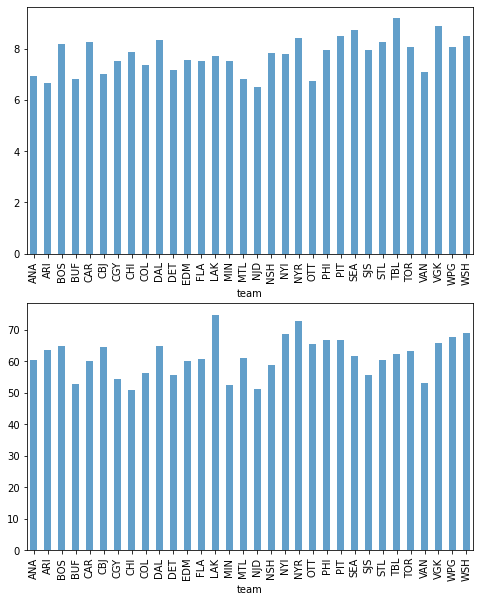

In [11]:
#Do a couple of player stats

fig, axes = plt.subplots(2, 1, figsize=(8,10))
#Goals
_= team['I_F_goals'].plot.bar(ax=axes[0], alpha=0.7)
#Salary
_ = team['I_F_hits'].plot.bar(ax=axes[1], alpha = .7)

### Salary for each Team

In [12]:
import plotly.express as px
px.box(df[['team','SALARY']].melt(id_vars=['team'], var_name = "col" ), x = "team", y='value', 
       color = 'team',facet_col='col').update_yaxes(matches=None)

### Anova Test

In [13]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

model = ols('SALARY ~ C(team)', data=df[['team','SALARY']]).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
anova_table

,sum_sq,df,F,PR(>F)
C(team),4.992358e+14,31.0,3.071978,2.082717e-08
Residual,5.857277e+16,11173.0,NaN,NaN


### Average Stats vs Average Salary for Each Team

<AxesSubplot:xlabel='penalityMinutes', ylabel='SALARY'>

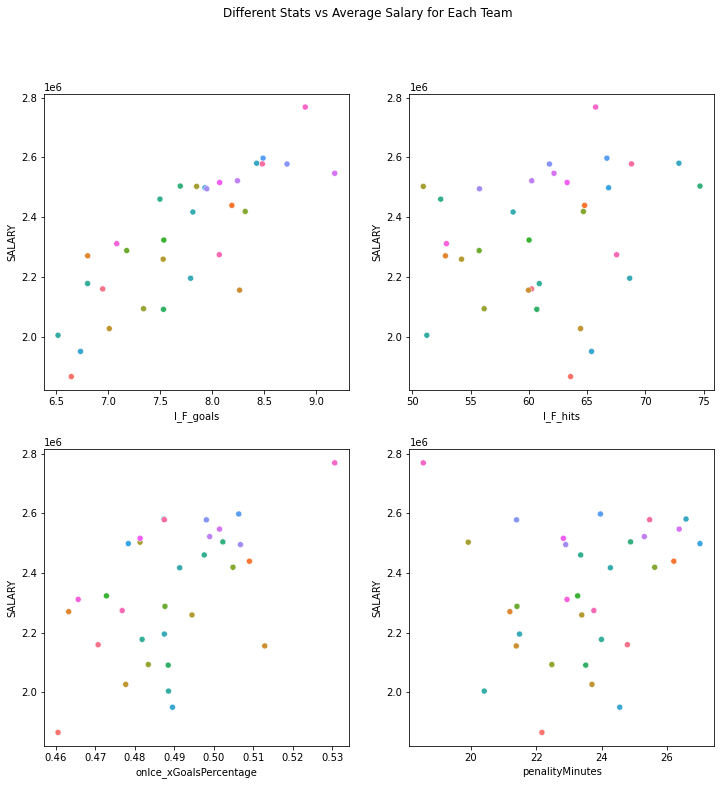

In [39]:
#Define the amount we want

fig, axes = plt.subplots(2,2, figsize=(12,12))
                         
fig.suptitle('Different Stats vs Average Salary for Each Team')

sns.scatterplot(ax = axes[0,0], x='I_F_goals',y='SALARY', data = team, hue ='team', legend = False)
sns.scatterplot(ax = axes[0,1], x='I_F_hits',y='SALARY', data = team, hue ='team', legend = False)
sns.scatterplot(ax = axes[1,0], x='onIce_xGoalsPercentage',y='SALARY', data = team, hue ='team', legend = False)
sns.scatterplot(ax = axes[1,1], x='penalityMinutes',y='SALARY', data = team, hue ='team', legend = False)

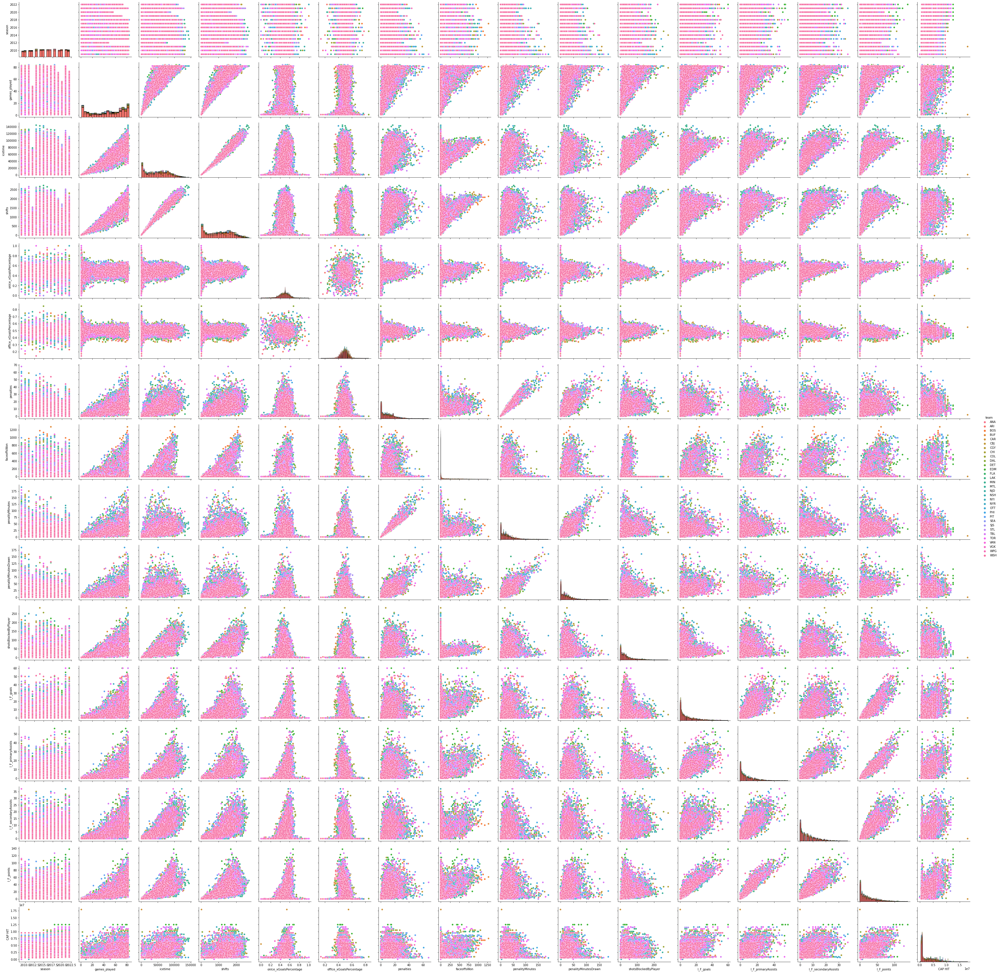

In [38]:
_= sns.pairplot(stats_only, hue="team", height=3, diag_kind="hist")

### Tax Rates

<AxesSubplot:xlabel='EffTaxRate', ylabel='SALARY'>

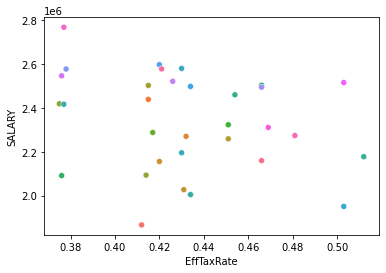

In [47]:
sns.scatterplot(x='EffTaxRate',y='SALARY', data = team, hue ='team', legend = False)

### Correlation Matrix

In [76]:
corr_matrix = df.corr()
updated = corr_matrix.iloc[2:,np.r_[25,29,30,31]]

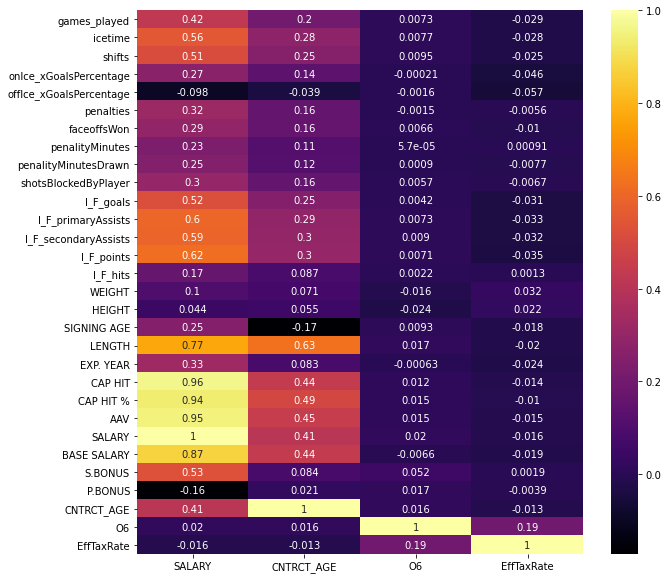

In [77]:
fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(updated, annot=True, cmap = 'inferno') #kwags size to change text size
plt.show()